In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import os
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
os.chdir('/home/ak431480')

# Date: 21.10.2025
# Analyzing ARNEO cell2location celltype mapping results

In [2]:
## Load spatial data with cell2location mapping results
def load_slide(sample, obs_data, path='/scratch/svc_td_compbio/users/kiviaho/prostate_spatial/data/normalized_visium/'):
    slide = sc.read_h5ad(f'{path}{sample}_normalized.h5ad')
    #slide.obs_names = sample + '_' + slide.obs_names
    obs_data = pd.merge(slide.obs,obs_data[obs_data['sample_id'] == sample],left_index=True, right_index=True,how='right')
    slide = slide[obs_data.index].copy()
    slide.obs = obs_data.copy()
    return slide

In [13]:

spatial_data = sc.read_h5ad('/scratch/svc_td_compbio/users/kiviaho/ARNEO/c2l_dir/cell2location_map/sp.h5ad')
spatial_data.obs[spatial_data.uns['mod']['factor_names']] = spatial_data.obsm['q05_cell_abundance_w_sf'] # Extract the 5% quantile from the posterior distribution

# Map sample annotation
sample_annot_dict = pd.read_excel('./ARNEO_tampere_sample_sheet.xlsx',index_col=0).to_dict()['treatment']
spatial_data.obs['type'] = spatial_data.obs['sample_id'].map(sample_annot_dict)
spatial_data.obs['type'] = pd.Categorical(spatial_data.obs['type'],categories=['naive','ADT','ADT+APA'])

# Celltype_annotation
celltype_annotation_df = pd.read_excel('./single_cell_celltype_annotation.xlsx',index_col=0)
celltype_annot_dict = celltype_annotation_df.to_dict()['celltype name']

# Scale down the outlier Epithelial cell_0 to test feasibility otherwise NOTE: DELETE BEFORE FINAL ANALYSIS
spatial_data.obs['Epithelial cell_0'] = spatial_data.obs['Epithelial cell_0'] / 5

# Create obs data df
obs_data_df = spatial_data.obs.copy()

celltypes = spatial_data.uns['mod']['factor_names']
celltypes = obs_data_df[celltypes].mean().sort_values(ascending=False).index.to_list()

samples = list(sample_annot_dict.keys())


In [23]:
df = obs_data_df[celltypes]
df.columns = df.columns.map(celltype_annot_dict)
df.describe()[df.columns[:10]]

,PCA3+SPINK1+ Luminal epithelial cell,ACTA2+RGS5+ Fibroblast,ACPP+SFTPA2+ Luminal epithelial cell,AMACR+FABP5+ Luminal epithelial cell,DCN+LUM+ Fibroblast,LGALS1+COMP+ Fibroblast,Inactive Macrophage,KRT5+TP63+ Basal epithelial cell,WFDC2+PIGR+ APC epithelial cell,GNLY+CXCL8+ Fibroblast
count,30585.000000,30585.000000,30585.000000,3.058500e+04,3.058500e+04,30585.000000,30585.000000,30585.000000,30585.000000,30585.000000
mean,5.854684,4.405856,2.821489,1.661931e+00,1.333864e+00,1.109191,0.952203,0.831585,0.728053,0.596290
std,7.286754,6.614717,3.901651,1.770902e+00,1.580739e+00,1.493763,1.771040,2.403355,2.256820,0.816048
min,0.000740,0.000005,0.000004,8.239652e-07,7.639267e-07,0.000001,0.000077,0.000032,0.000013,0.000009
25%,0.165325,0.241291,0.014596,1.736679e-01,1.759674e-01,0.112823,0.083623,0.013886,0.011631,0.060366
50%,2.906867,1.583949,1.441682,1.060656e+00,8.029466e-01,0.601586,0.354177,0.066448,0.043076,0.280900
75%,9.725305,6.098387,4.288476,2.841279e+00,1.967097e+00,1.517077,1.095575,0.424425,0.316074,0.857663
max,74.346519,85.669452,41.018289,1.561411e+01,1.637130e+01,20.574612,39.987827,60.960436,66.930045,10.366076


/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


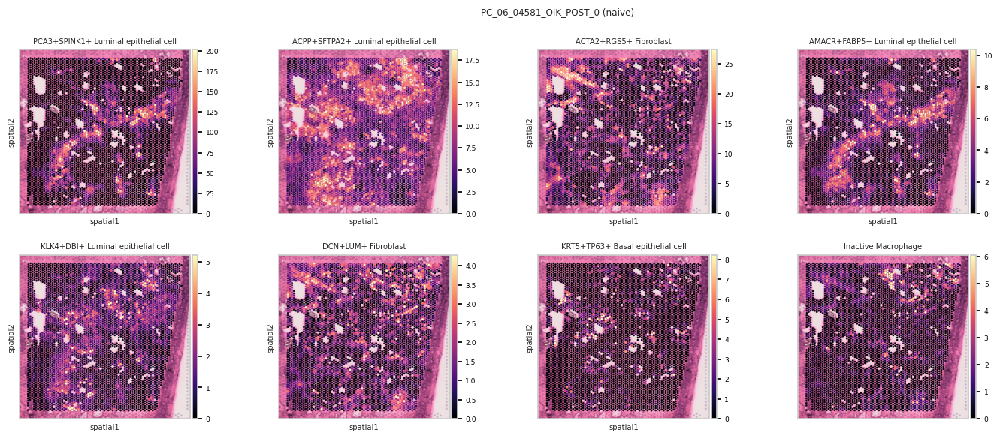

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


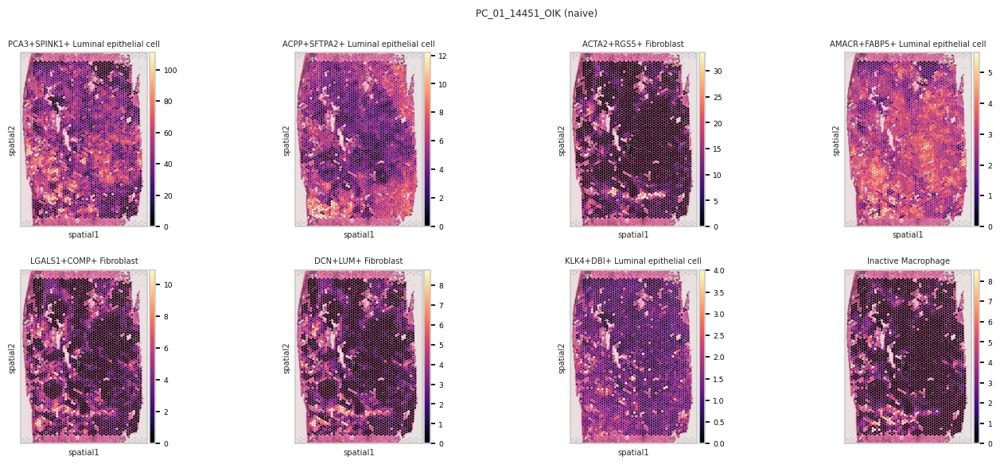

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


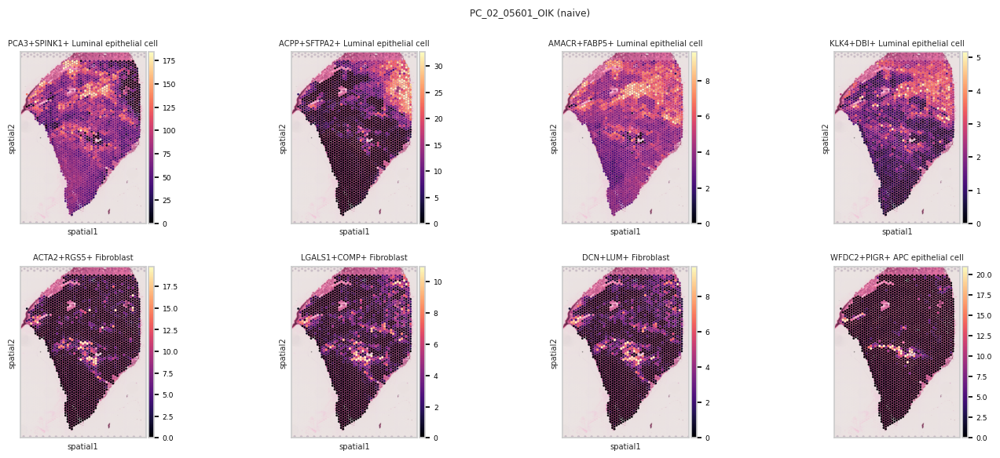

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


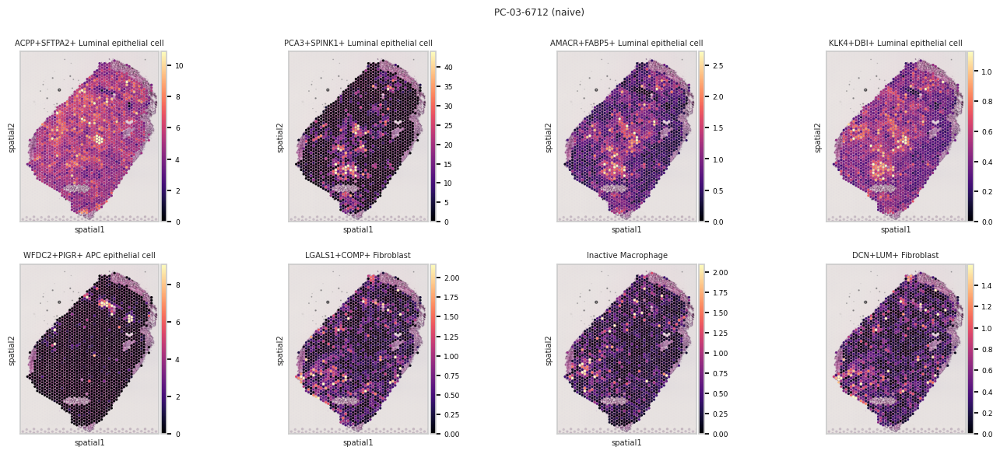

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


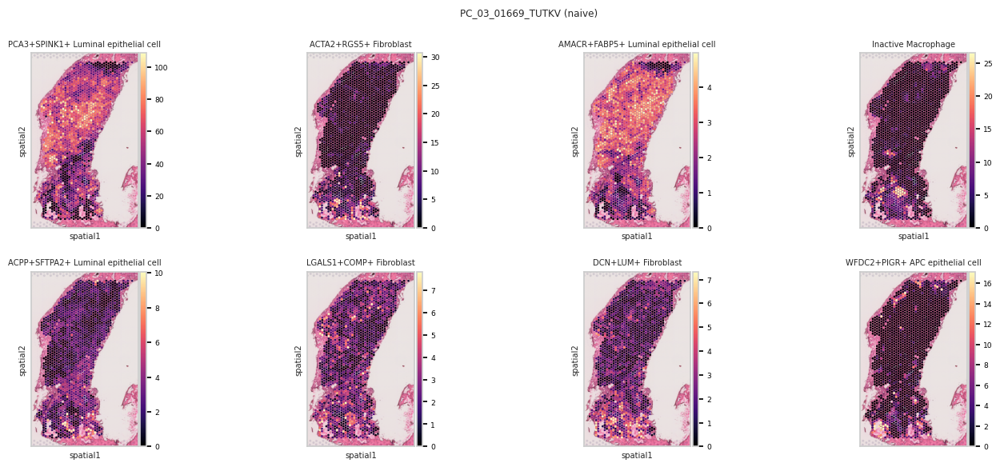

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


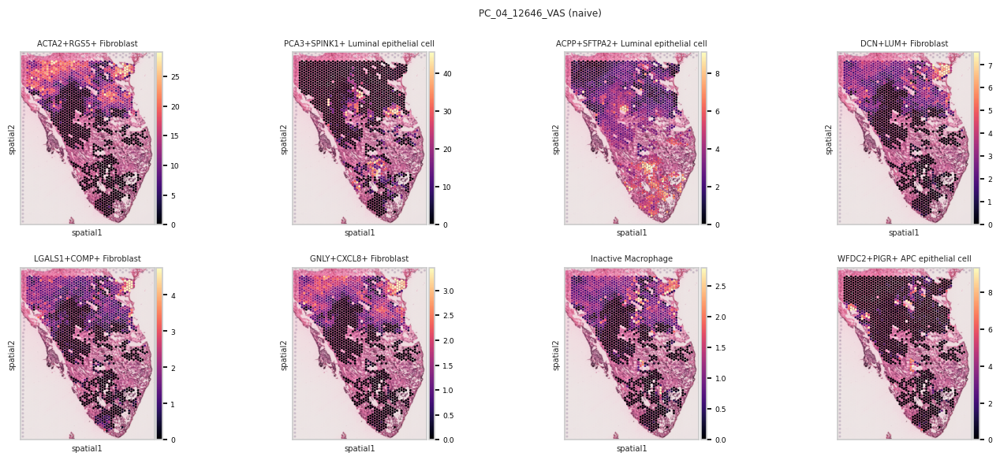

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


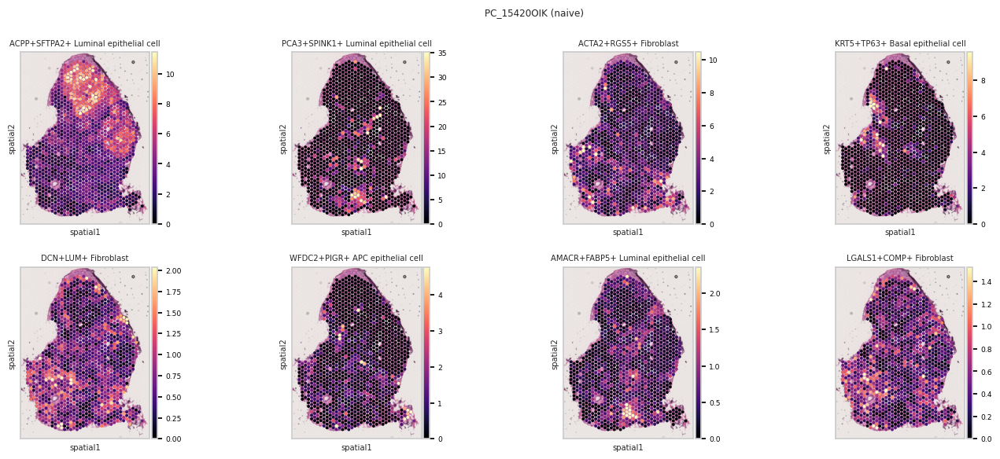

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


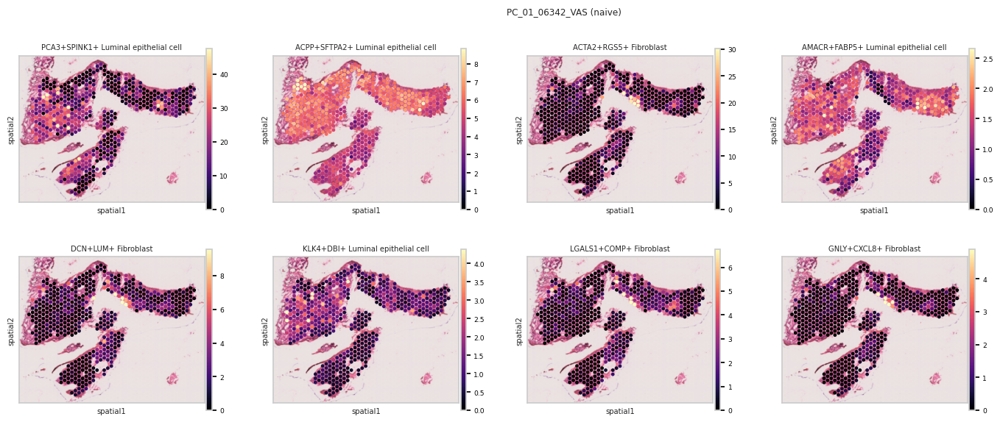

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


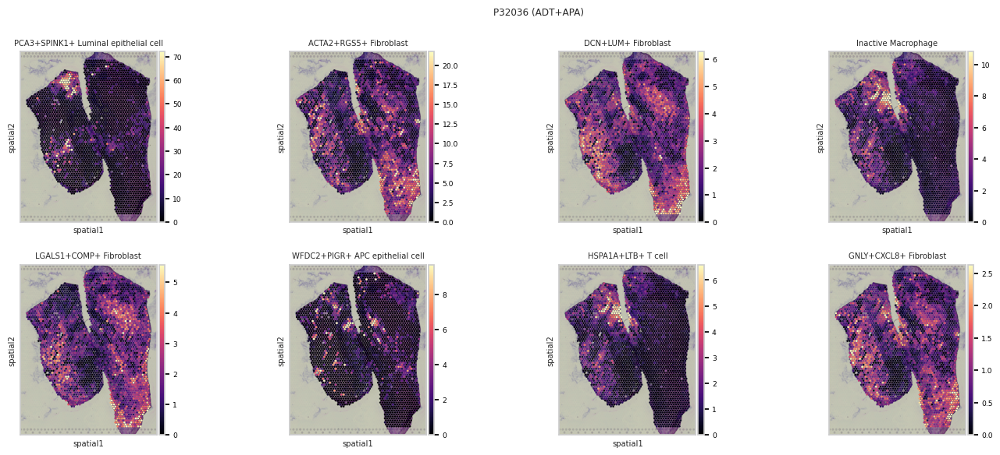

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


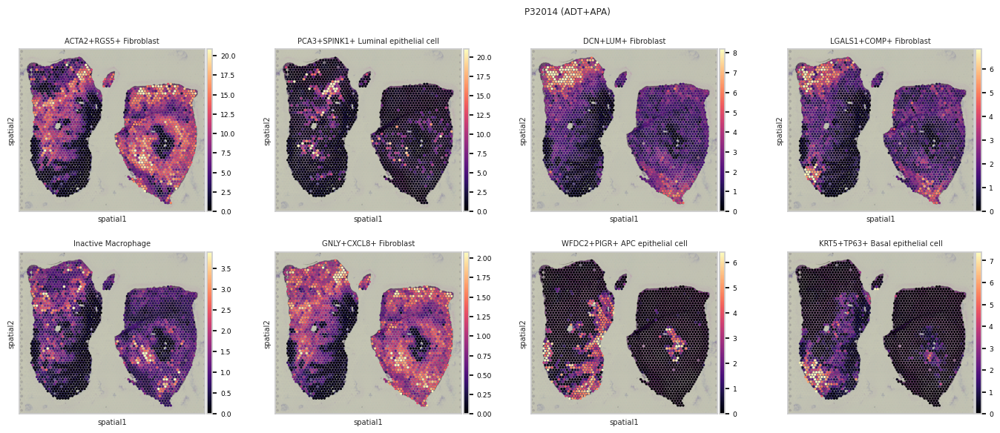

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


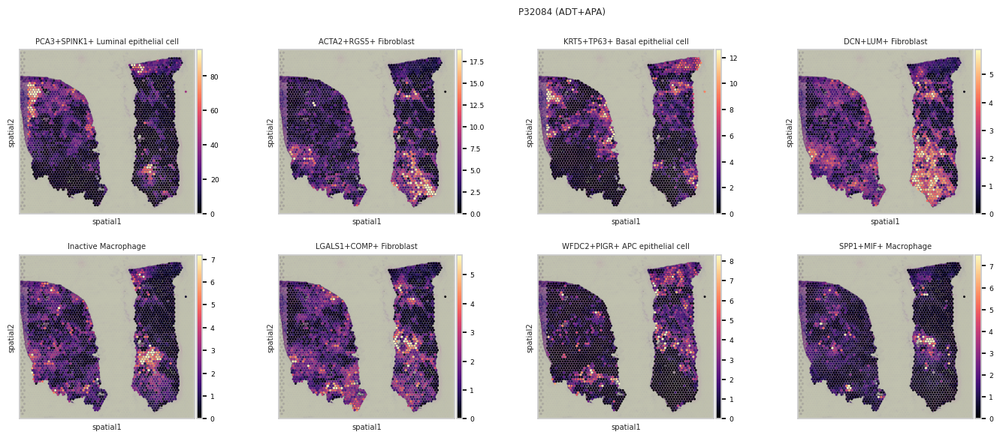

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


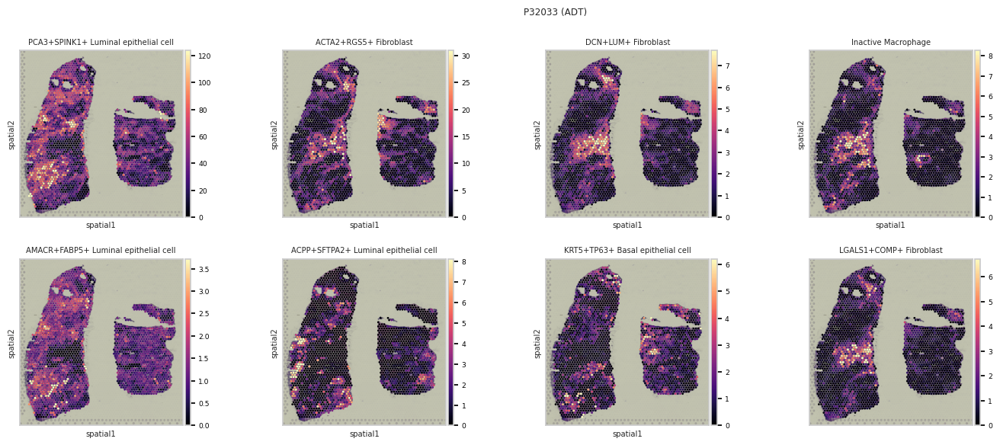

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


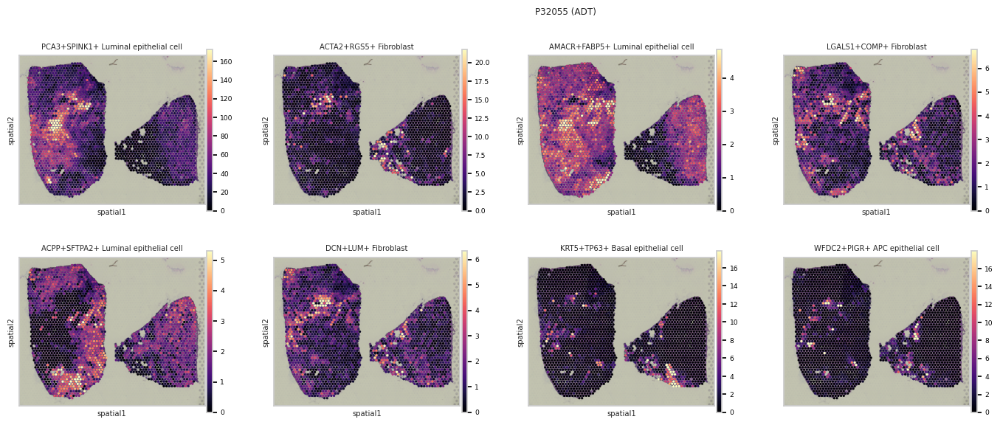

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


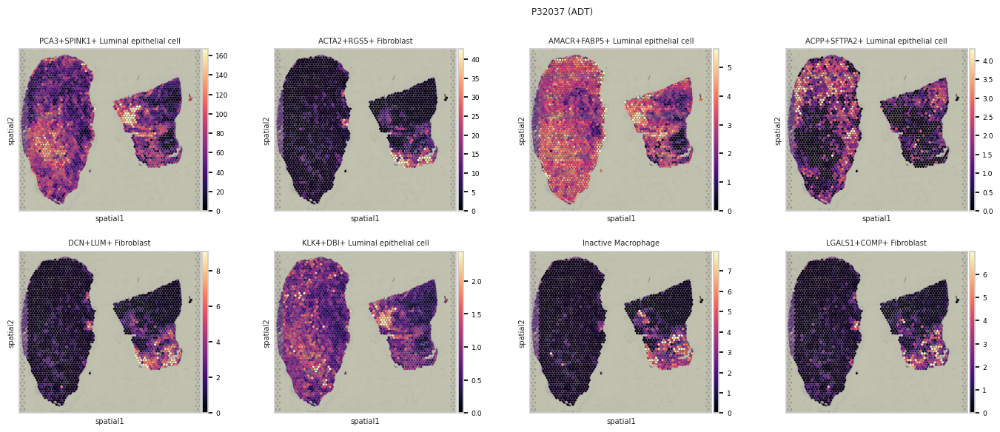

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


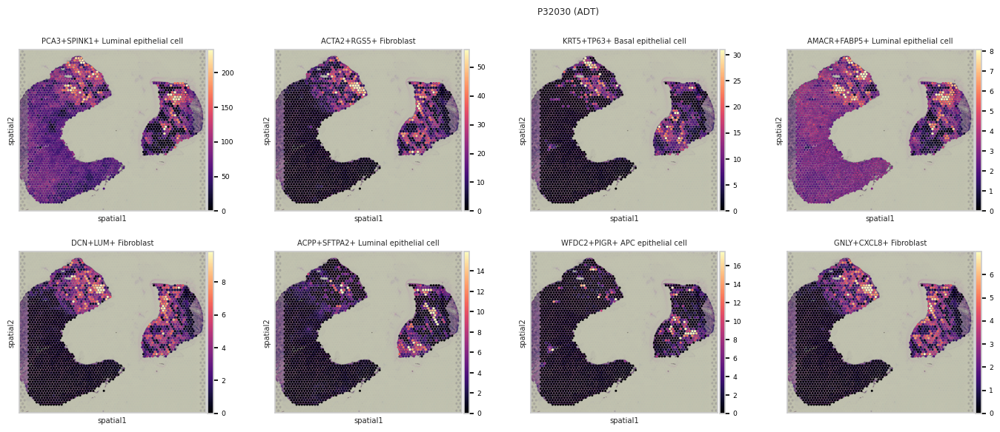

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


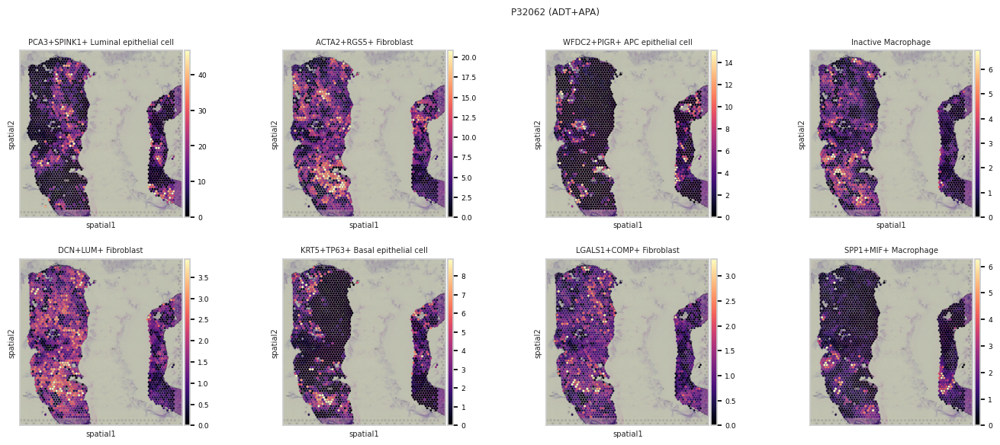

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


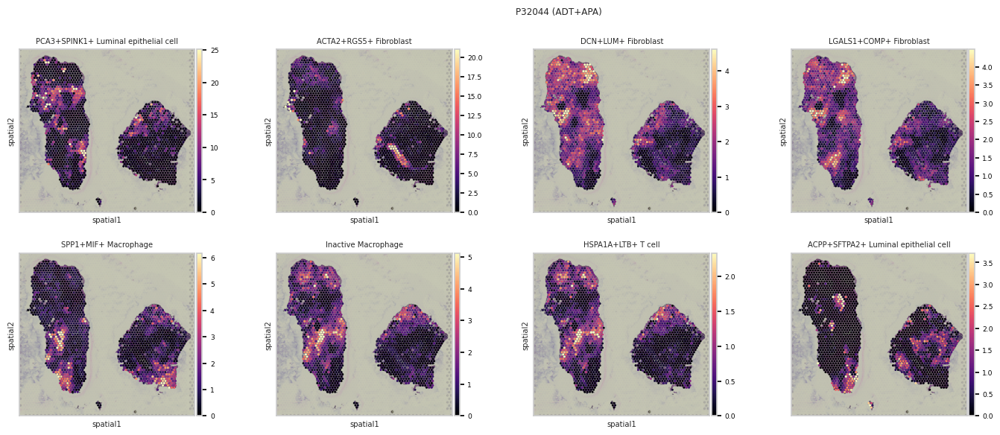

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


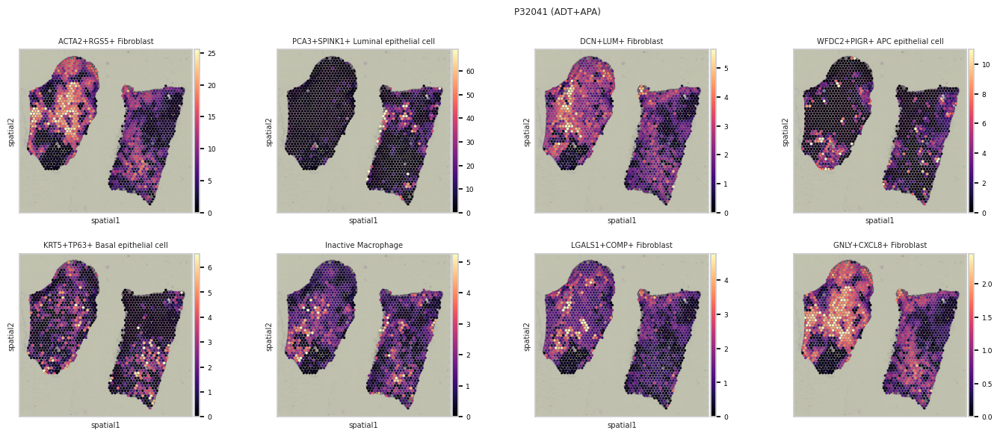

/tmp/ipykernel_455364/40086723.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_455364/40086723.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


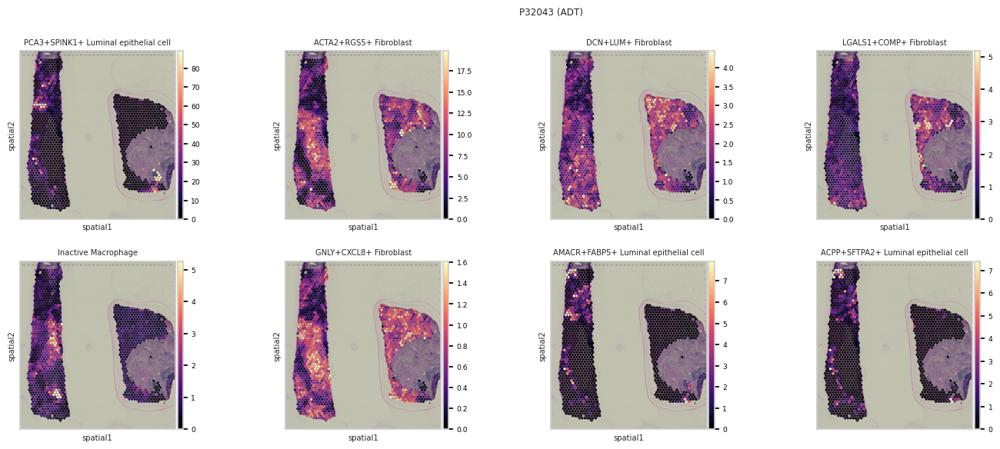

In [5]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting

sns.set_theme(
    style='whitegrid',
    font_scale=0.6,
    rc={
        'xtick.bottom': True,
        'ytick.left': True,
        'xtick.major.size': 4,
        'ytick.major.size': 4,
        'xtick.color': 'black',
        'ytick.color': 'black'
    }
)

# All samples
for sample in samples:

       slide = load_slide(sample,obs_data_df)
       celltypes_slide = slide.obs[celltypes].mean().sort_values(ascending=False).index.to_list()
       slide.obs = slide.obs.rename(columns=celltype_annot_dict)
       
       # plot in spatial coordinates
       with mpl.rc_context({'axes.facecolor':  'black',
                            'figure.figsize': [3.3, 3]}):

              fig = sc.pl.spatial(
              slide,
              cmap='magma',
              color=[celltype_annot_dict[k] for k in celltypes_slide[:8]],
              ncols=4,
              size=1.3,
              img_key='lowres',
              vmin=0,
              vmax='p99.2',
              show=False,        # 👈 important
              return_fig=True    # 👈 return the figure instead of showing it
              )
       sampletype = sample_annot_dict[sample]
       fig.suptitle(f'{sample} ({sampletype})')  # 👈 add title to that figure
       plt.xlabel(None)
       plt.ylabel(None)
       fig.tight_layout()
       #fig.savefig(f'./plots/{sample}_most_abundant_celltypes_on_spatial.pdf')
       plt.show()
       #plt.close(fig)



## Add pathology annotation

In [16]:
tampere_pc = [s for s in samples if 'PC_' in s]
annot_lst = []
for sample in tampere_pc:
    annot = pd.read_csv(f'/scratch/svc_td_compbio/users/kiviaho/prostate_spatial/data/pathology_annotation_exclude_info/{sample}.csv',index_col=0)
    annot.index = sample + '_' + annot.index
    annot_lst.append(annot)
tampere_pathology_annotation = pd.concat(annot_lst)
tampere_pathology_annotation.columns = ['Pathology.Annotations']
tampere_pathology_annotation.head()
tampere_pathology_annotation.to_csv('./ST_pathology_annotation/Tampere_pathology_annotations_20251021.csv')

In [17]:
tampere_pathology_annot = pd.read_csv('./ST_pathology_annotation/Tampere_pathology_annotations_20251021.csv',index_col=0)
arneo_pathology_annot = pd.read_csv('./ST_pathology_annotation/ARNEO_pathology_annotations_20251021.csv',index_col=0)
arneo_pathology_annot = arneo_pathology_annot[['Pathology.Annotations']]

pathology_annotations = pd.concat([tampere_pathology_annot,arneo_pathology_annot],axis=0)
pathology_annotations.head()

,Pathology.Annotations
PC_06_04581_OIK_POST_0_AAACAACGAATAGTTC-1,Stroma
PC_06_04581_OIK_POST_0_AAACAAGTATCTCCCA-1,Benign
PC_06_04581_OIK_POST_0_AAACAATCTACTAGCA-1,Benign
PC_06_04581_OIK_POST_0_AAACACCAATAACTGC-1,Stroma
PC_06_04581_OIK_POST_0_AAACAGAGCGACTCCT-1,Stroma


In [18]:
# Merge in the pathology annotation
obs_data_df = pd.merge(obs_data_df,pathology_annotations,left_index=True,right_index=True,how='left')

In [19]:
# Annotate tissue in 4 separate categories:
# Tumour 
# Benign
# Stroma
# drop

pathology_mapping_dict = {
    # Tampere annotation format
    'Stroma': 'Stroma',
    'Benign': 'Benign',
    'Gleason 4': 'Tumour > 50%',
    'Exclude': 'drop',
    'Gleason 3': 'Tumour < 50%',
    'Gleason 4 cribriform': 'Tumour > 50%',
    'Inflammation': 'Stroma',
    'Gleason 5': 'Tumour > 50%',
    'Atrophy': 'Benign',
    'Lumen': 'drop',

    ## ARNEO annotation format
    'Stroma' : 'Stroma',
    'Tumor51-100' : 'Tumour > 50%',
    'Benign51-100' : 'Benign',
    'Benign1-50' : 'Benign',
    'Out of focus - exclude': 'drop',
    'Ignore' : 'drop',
    'Tumor1-50' : 'Tumour < 50%',
    'Epithelium - benign' : 'Benign',
    'Tumour >50%' : 'Tumour > 50%',
    'Tumour <50%' : 'Tumour < 50%',
    #'HGPIN' : 'Benign',
    'HGPIN' : 'drop',
    'Fold - exclude' : 'drop',
    'Epithelium - difficult to assess':'drop',
    'Tumour<50%': 'Tumour < 50%',
    'MixedEpithelium' : 'Benign',
    'Mixed' : 'Benign',
    'Mixed normal epithelium':'Benign',
    'No tissue - exclude' : 'drop',
    'Out of focus - exclude':'drop',
    'Seminal vesicle - benign':'drop',
    'Coropora amylacea - exclude':'drop',
    'Unable to assess - exclude':'drop'
    }

obs_data_df['Pathology'] = obs_data_df['Pathology.Annotations'].map(pathology_mapping_dict)
obs_data_df = obs_data_df[~(obs_data_df['Pathology'] == 'drop')]
obs_data_df['Pathology'] = pd.Categorical(obs_data_df['Pathology'],categories = ['Tumour > 50%', 'Tumour < 50%', 'Benign', 'Stroma'])

# Replace two-way tumour annotation with just "Tumour"
obs_data_df['Pathology'] = obs_data_df['Pathology'].replace({'Tumour > 50%': 'Tumour', 'Tumour < 50%': 'Tumour'})

In [20]:
obs_data_df

,in_tissue,array_row,array_col,n_counts,size_factors,sample_id,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,...,Myeloid cell_4,T cell_0,T cell_1,T cell_2,T cell_3,T cell_5,T cell_7,type,Pathology.Annotations,Pathology
PC_15420OIK_AAACGAGACGGTTGAT-1,1,35,79,4946.0,0.874068,PC_15420OIK,NaN,NaN,NaN,NaN,...,0.022890,0.014108,0.060770,0.012873,0.039026,0.013811,0.018620,naive,Stroma,Stroma
PC_15420OIK_AAACTGCTGGCTCCAA-1,1,45,67,6420.0,1.033064,PC_15420OIK,NaN,NaN,NaN,NaN,...,0.014430,0.008347,0.042170,0.005720,0.037666,0.005485,0.008861,naive,Gleason 4 cribriform,Tumour
PC_15420OIK_AAAGGGATGTAGCAAG-1,1,24,62,2174.0,0.386986,PC_15420OIK,NaN,NaN,NaN,NaN,...,0.025256,0.020719,0.056346,0.016633,0.024330,0.009532,0.024338,naive,Stroma,Stroma
PC_15420OIK_AAAGTGTGATTTATCT-1,1,44,94,12669.0,2.030597,PC_15420OIK,NaN,NaN,NaN,NaN,...,0.002384,0.005014,0.010022,0.002993,0.016279,0.000776,0.004444,naive,Benign,Benign
PC_15420OIK_AAAGTTGACTCCCGTA-1,1,42,96,18988.0,3.187107,PC_15420OIK,NaN,NaN,NaN,NaN,...,0.003680,0.013749,0.012447,0.008320,0.026870,0.002655,0.010927,naive,Inflammation,Stroma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P32084_TTGTGGTGGTACTAAG-1,1,63,95,4165.0,0.531240,P32084,2095.0,7.647786,4166.0,8.334951,...,0.016175,0.026905,0.803675,0.076171,0.035255,0.283872,0.092529,ADT+APA,NaN,NaN
P32084_TTGTTCTAGATACGCT-1,1,21,3,6846.0,0.814434,P32084,2628.0,7.874359,6848.0,8.831858,...,0.008171,0.017951,0.560520,0.044745,0.165530,0.120745,0.035571,ADT+APA,NaN,NaN
P32084_TTGTTTCACATCCAGG-1,1,58,42,7360.0,1.043005,P32084,3410.0,8.134761,7362.0,8.904222,...,0.030387,0.012140,0.060081,0.008814,0.011903,0.009280,0.023676,ADT+APA,NaN,NaN
P32084_TTGTTTCATTAGTCTA-1,1,60,30,2399.0,0.329646,P32084,1415.0,7.255591,2399.0,7.783224,...,0.020281,0.011470,0.486783,0.027609,0.006381,0.104952,0.038090,ADT+APA,NaN,NaN


In [21]:
# Get the broad cell type prefix from each fine-grained cell type
broad_celltypes = [c.split('_')[0] for c in celltypes]

# Map each broad cell type to its constituent fine cell type columns
from collections import defaultdict
broad_to_fine = defaultdict(list)
for c, broad in zip(celltypes, broad_celltypes):
    broad_to_fine[broad].append(c)

# Compute mean abundance per broad cell type
broad_means = {
    broad: obs_data_df[cols].mean().sum()
    for broad, cols in broad_to_fine.items()
}

# Sort by descending mean abundance
broad_celltypes_sorted = sorted(broad_means.keys(), key=lambda k: broad_means[k], reverse=True)

# Optional: print summary
for b in broad_celltypes_sorted:
    print(f"{b}: {broad_means[b]:.3f}")

# Overwrite your variable if you want to use it directly
broad_celltypes = broad_celltypes_sorted


Epithelial cell: 13.017
Fibroblast: 8.041
Myeloid cell: 1.687
T cell: 0.858
B cell: 0.853
Endothelial cell: 0.701
Mast cell: 0.267


/tmp/ipykernel_455364/3148642574.py:70: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_xticklabels([f'{sample_types[0]} (n={vcounts[0]})',
/tmp/ipykernel_455364/3148642574.py:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[1]} (n={vcounts[1]})',
/tmp/ipykernel_455364/3148642574.py:72: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[2]} (n={vcounts[2]})'])
/tmp/ipykernel_455364/3148642574.py:70: 

/tmp/ipykernel_455364/3148642574.py:70: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_xticklabels([f'{sample_types[0]} (n={vcounts[0]})',
/tmp/ipykernel_455364/3148642574.py:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[1]} (n={vcounts[1]})',
/tmp/ipykernel_455364/3148642574.py:72: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[2]} (n={vcounts[2]})'])
/tmp/ipykernel_455364/3148642574.py:70: 

<Figure size 640x480 with 0 Axes>

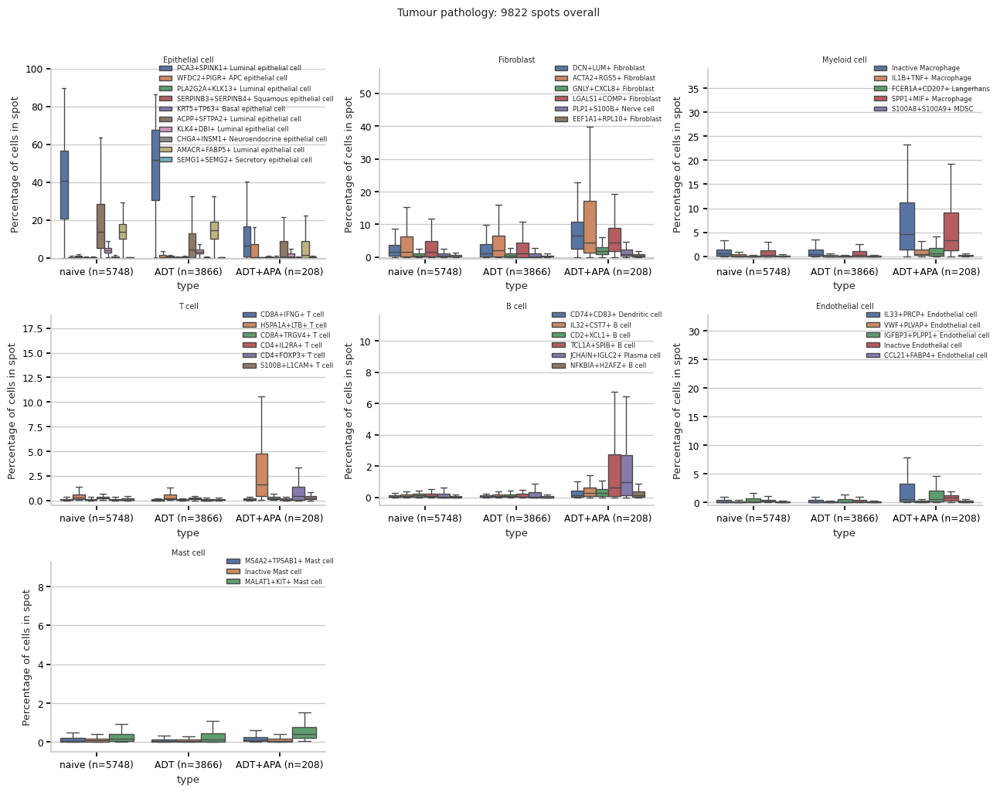

/tmp/ipykernel_455364/3148642574.py:70: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_xticklabels([f'{sample_types[0]} (n={vcounts[0]})',
/tmp/ipykernel_455364/3148642574.py:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[1]} (n={vcounts[1]})',
/tmp/ipykernel_455364/3148642574.py:72: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[2]} (n={vcounts[2]})'])
/tmp/ipykernel_455364/3148642574.py:70: 

<Figure size 640x480 with 0 Axes>

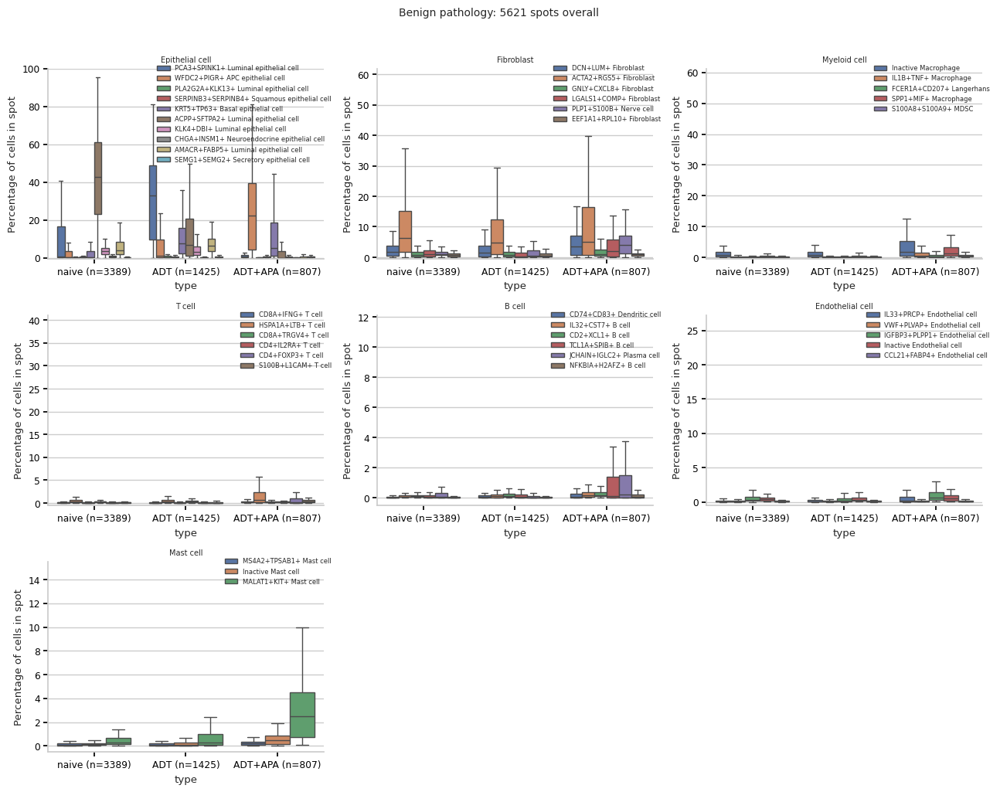

/tmp/ipykernel_455364/3148642574.py:70: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_xticklabels([f'{sample_types[0]} (n={vcounts[0]})',
/tmp/ipykernel_455364/3148642574.py:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[1]} (n={vcounts[1]})',
/tmp/ipykernel_455364/3148642574.py:72: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[2]} (n={vcounts[2]})'])
/tmp/ipykernel_455364/3148642574.py:70: 

<Figure size 640x480 with 0 Axes>

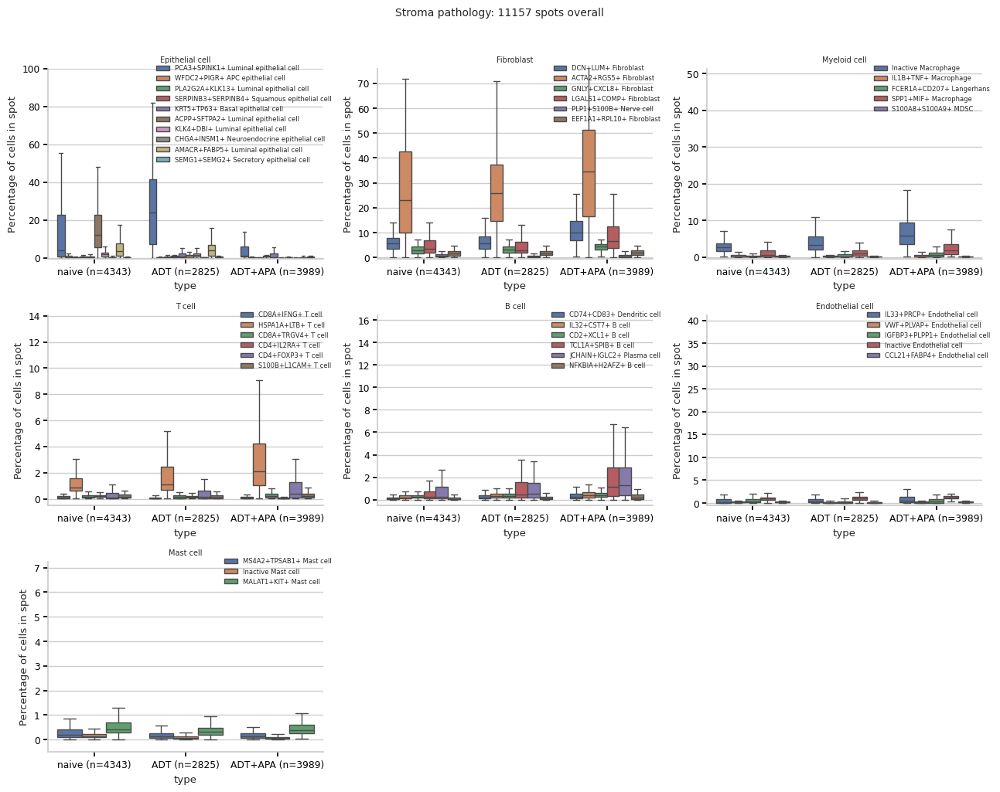

In [22]:
sns.set_theme(
    style='whitegrid',
    font_scale=0.8,
    rc={
        'xtick.bottom': True,
        'ytick.left': True,
        'xtick.major.size': 4,
        'ytick.major.size': 4,
        'xtick.color': 'black',
        'ytick.color': 'black'
    }
)

pathology_regions = obs_data_df['Pathology'].cat.categories.copy()

obs_data_df_subset = obs_data_df.copy()
# compute row sums fresh for the subset
row_sums = obs_data_df_subset[celltypes].sum(axis=1)
obs_data_df_subset[celltypes] = obs_data_df_subset[celltypes].div(row_sums, axis=0)

# Grid layout
n_rows, n_cols = 3, 3

for pathology_region in pathology_regions:
    plot_df = obs_data_df_subset[obs_data_df_subset['Pathology'] == pathology_region]

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(13, 10))
    axes = axes.flatten()

    for i, ctype in enumerate(broad_celltypes):
        if i >= n_rows * n_cols:
            break

        ax = axes[i]
        celltypes_to_plot = celltype_annotation_df[
            celltype_annotation_df['broad celltype'] == ctype
        ]['celltype name'].tolist()

        plot_df = plot_df.rename(columns=celltype_annot_dict)

        try:
            melted = plot_df.melt(
                id_vars='type',
                value_vars=celltypes_to_plot,
                var_name=ctype,
                value_name='Fraction'
            )
            melted['Fraction'] = melted['Fraction'] * 100

            sns.boxplot(
                data=melted,
                x='type',
                y='Fraction',
                hue=ctype,
                fliersize=0,
                ax=ax
            )

            if ctype == 'Epithelial cell':
                ax.set_ylim(-0.5, 100)
            else:
                ax.set_ylim(-0.5, melted['Fraction'].quantile(0.9999))
            ax.set_ylabel('Percentage of cells in spot')
            ax.set_title(ctype, fontsize=7)
            ax.spines[['top', 'right']].set_visible(False)

            sample_types = plot_df['type'].cat.categories
            vcounts = plot_df['type'].value_counts().loc[sample_types]

            ax.set_xticklabels([f'{sample_types[0]} (n={vcounts[0]})',
                                f'{sample_types[1]} (n={vcounts[1]})',
                                f'{sample_types[2]} (n={vcounts[2]})'])

            # Legend styling — small and non-overlapping
            ax.legend(
                title=None,
                fontsize=6,
                loc='upper right',
                frameon=False,
                bbox_to_anchor=(1.05, 1.05)
            )

        except Exception as e:
            ax.set_visible(False)
            continue

    # Hide unused subplots if fewer than 9 broad types
    for j in range(len(broad_celltypes), n_rows * n_cols):
        axes[j].set_visible(False)

    fig.suptitle(f'{pathology_region} pathology: {np.sum(vcounts)} spots overall', fontsize=10, y=1.02)
    fig.tight_layout()
    plt.show()
    plt.clf()


In [26]:
obs_data_df['sample_id'].unique()

['PC_15420OIK', 'PC_04_12646_VAS', 'PC-03-6712', 'PC_02_05601_OIK', 'PC_01_14451_OIK', ..., 'P32043', 'P32044', 'P32055', 'P32062', 'P32084']
Length: 19
Categories (19, object): ['P32014', 'P32030', 'P32033', 'P32036', ..., 'PC_03_01669_TUTKV', 'PC_04_12646_VAS', 'PC_06_04581_OIK_POST_0', 'PC_15420OIK']